In [1]:
import os
from os.path import join
import sys
import random
import math
import re
import time
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import json
import tqdm
import pandas as pd
from collections import defaultdict
import random
import pickle
import cv2
cv2.ocl.setUseOpenCL(False)

from config import Config
import utils
import model as modellib
import visualize
from model import log
from config import Config
import augs

%matplotlib inline 

%load_ext autoreload
%autoreload 2

Using TensorFlow backend.


In [2]:
def get_ax(rows=1, cols=1, size=8):
    """Return a Matplotlib Axes array to be used in
    all visualizations in the notebook. Provide a
    central point to control graph sizes.
    
    Change the default size attribute to control the size
    of rendered images
    """
    _, ax = plt.subplots(rows, cols, figsize=(size*cols, size*rows))
    return ax

In [3]:
def makedirs(dirpath):
    if not os.path.exists(dirpath):
        os.makedirs(dirpath)

# Root directory of the project
ROOT_DIR = os.getcwd()

# Directory to save logs and trained model
MODEL_DIR = os.path.join(ROOT_DIR, 'experiments', 'attempt3')
makedirs(MODEL_DIR)

# Local path to trained weights file
COCO_MODEL_PATH = os.path.join(ROOT_DIR, "mask_rcnn_coco.h5")
# Download COCO trained weights from Releases if needed
if not os.path.exists(COCO_MODEL_PATH):
    utils.download_trained_weights(COCO_MODEL_PATH)

In [4]:
data = pd.read_csv('/data/sample_submission_old.csv')

classes = [
    'dining_table',
    'shelf', #
    'armchair',
    'lamp', #
    'couch', # 
    'desk',
    'chair',  
    'bed', # 
    'wardrobe' #
]
# classes = set(json.loads(data.iloc[0]['result'])['aabb'].keys())
# classes

# stop

In [8]:
def load_samples(csv_filepath, dirpath, classes):
    def read_objs(marks):
        result = []
        try:
            marks = marks['aabb']
            if set(marks.keys()) != classes:
                raise Exception()
            for k, v in marks.items():
                for polygon in v:
                    polygon = np.array(polygon)
                    x, y = polygon[:, 0], polygon[:, 1]
                    left, top, right, bottom = np.min(x), np.min(y), np.max(x), np.max(y)
                    result.append({
                        'cls': k,
                        'bbox': {
                            'left': left,
                            'top': top,
                            'right': right,
                            'bottom': bottom
                        }
                    })
        except:
            return None
        return result
        
    samples = []
    data = pd.read_csv(csv_filepath)
    for k, v in list(data.iterrows()):
        id = v['id']
        filepath = join(dirpath, '%06d.jpg' % (int(id)))
        if not os.path.exists(filepath):
            continue
        img = cv2.imread(filepath)
        h, w = img.shape[:2]
        resolution = {'w': w, 'h': h}
        objs = read_objs(json.loads(v['result']))
        if objs is None:
            print('Skipping image with id {}'.format(id))
            continue
        samples.append({
            'filepath': filepath,
            'resolution': resolution,
            'objs': objs
        })
    return samples

In [67]:
samples = np.array(load_samples('/data/train.csv', '/data/images', classes))

Skipping image with id 5332


In [6]:
def show_sample(sample):
    img = cv2.imread(sample['filepath'])[:, :, ::-1]
    h, w = sample['resolution']['h'], sample['resolution']['w']
    for obj in sample['objs']:
        left, top, right, bottom = (
            int(obj['bbox']['left'] * w),
            int(obj['bbox']['top'] * h),
            int(obj['bbox']['right'] * w),
            int(obj['bbox']['bottom'] * h)
        )
        img = img.copy()
        cv2.rectangle(img, (left, top), (right, bottom), (255, 255, 255), 3)
    plt.figure(figsize=(10, 10))
    plt.imshow(img)
    plt.show()

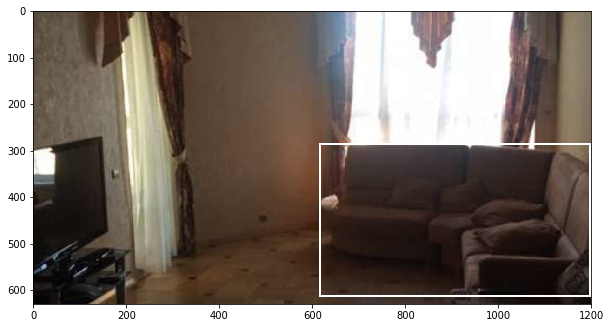

In [70]:
show_sample(samples[2])

In [7]:
def count_objects(samples):
    result = defaultdict(int)
    for sample in samples:
        for obj in sample['objs']:
            result[obj['cls']] += 1
    return result

def normalize(d, fraq):
    result = {}
    for k, v in d.items():
        result[k] = v / fraq
    return result

def get_error(counts, all_counts):
    error = 0
    for k, v in all_counts.items():
        cur_error = abs(counts.get(k, 0) / v - 1)
        error = max(cur_error, error)
    return error

In [92]:
all_counts = count_objects(samples)
all_counts

defaultdict(int,
            {'armchair': 437,
             'bed': 708,
             'chair': 1580,
             'couch': 1146,
             'desk': 798,
             'dining_table': 555,
             'lamp': 2168,
             'shelf': 3206,
             'wardrobe': 800})

In [101]:
val_fraq = 0.075
error_th = 0.05
while True:
    indexes = list(range(len(samples)))
    random.shuffle(indexes)
    train_size = int(len(samples) * (1 - val_fraq))
    train_indexes = indexes[:train_size]
    val_indexes = indexes[train_size:]
    train_counts = normalize(count_objects(samples[train_indexes]), 1 - val_fraq)
    val_count = normalize(count_objects(samples[val_indexes]), val_fraq)
    train_error = get_error(train_counts, val_count)
    val_error = get_error(train_counts, val_count)
    error = max(train_error, val_error)
    if error < error_th:
        break

In [ ]:
train_samples, val_samples = samples[train_indexes], samples[val_indexes]
split = train_samples, val_samples
pickle.dump(split, open(join(MODEL_DIR, 'split.pickle'), 'wb'))

In [15]:
class WhateverDataset(utils.Dataset):
    def init(self, classes, samples):
        classes = list(classes)
        source = "furniture"
        for i, cls in enumerate(classes):
            self.add_class(source, i + 1, cls)

        for i in range(len(samples)):
            filepath, resolution, objs = (
                samples[i]['filepath'],
                samples[i]['resolution'],
                samples[i]['objs']
            )
                
            self.add_image(
                source, 
                path=None,
                image_id=i,
                filepath=filepath,
                resolution=resolution,
                objs=objs
            )
                           
    def load_image(self, index):
        filepath = self.image_info[index]['filepath']
        img = cv2.imread(filepath)[:, :, ::-1]
        return img
                           
    def load_mask(self, index):
        image_info = self.image_info[index]
        objs = image_info['objs']
        if len(objs) == 0:
            return super(WhateverDataset, self).load_mask(index)
        h, w = image_info['resolution']['h'], image_info['resolution']['w']
        mask = np.zeros((h, w, len(objs)), dtype=np.uint8)
        for i, obj in enumerate(objs):
            left, top, right, bottom = (
                int(obj['bbox']['left'] * w),
                int(obj['bbox']['top'] * h),
                int(obj['bbox']['right'] * w),
                int(obj['bbox']['bottom'] * h)
            )
            mask[top:bottom, left:right, i] = 1
        
        class_ids = np.array([self.class_names.index(obj['cls']) for obj in objs], dtype=np.int32)
        return mask, class_ids
                
    def image_reference(self, image_id):
        info = self.image_info[image_id]
        if info["source"] == "furniture":
            return info["furniture"]
        else:
            super(self.__class__).image_reference(self, image_id)

In [18]:
train_samples, val_samples = pickle.load(open('./experiments/attempt3/split.pickle', 'rb'))

In [19]:
# Training dataset
dataset_train = WhateverDataset()
dataset_train.init(classes, train_samples)
dataset_train.prepare()

# Validation dataset
dataset_val = WhateverDataset()
dataset_val.init(classes, val_samples)
dataset_val.prepare()

In [8]:
for index in range(100, 200):
    image = dataset_train.load_image(index)
    mask, clss = dataset_train.load_mask(index)
    print('before', image.shape, mask.shape, clss)
    if len(clss) == 0:
        image = augs.augment_color(image)[0]
    else:
        image, mask = augs.augment_color(image, mask)
        if len(mask.shape) == 2:
            mask = mask[:, :, np.newaxis]
    print('after', image.shape, mask.shape)
#     plt.imshow(img)
#     plt.show()
#     plt.imshow(masks[:, :, 0])
#     plt.show()

before (630, 1200, 3) (630, 1200, 1) [8]
after (630, 1200, 3) (630, 1200, 1)
before (630, 1200, 3) (0, 0, 0) []
after (630, 1200, 3) (0, 0, 0)
before (630, 1200, 3) (630, 1200, 5) [8 2 2 2 2]
after (630, 1200, 3) (630, 1200, 5)
before (630, 1200, 3) (630, 1200, 7) [7 6 4 4 5 2 2]
after (630, 1200, 3) (630, 1200, 7)
before (616, 1064, 3) (616, 1064, 8) [3 7 6 6 4 4 4 4]
after (616, 1064, 3) (616, 1064, 8)
before (630, 1200, 3) (0, 0, 0) []
after (630, 1200, 3) (0, 0, 0)
before (630, 1200, 3) (0, 0, 0) []
after (630, 1200, 3) (0, 0, 0)
before (630, 1200, 3) (630, 1200, 1) [8]
after (630, 1200, 3) (630, 1200, 1)
before (630, 1200, 3) (0, 0, 0) []
after (630, 1200, 3) (0, 0, 0)
before (630, 1200, 3) (0, 0, 0) []
after (630, 1200, 3) (0, 0, 0)
before (630, 1200, 3) (630, 1200, 5) [2 2 2 2 9]
after (630, 1200, 3) (630, 1200, 5)
before (630, 1200, 3) (0, 0, 0) []
after (630, 1200, 3) (0, 0, 0)
before (630, 1200, 3) (630, 1200, 1) [2]
after (630, 1200, 3) (630, 1200, 1)
before (630, 1200, 3) (

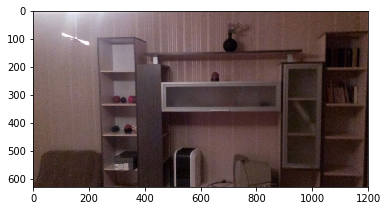

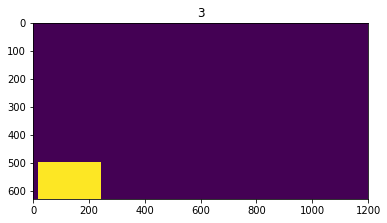

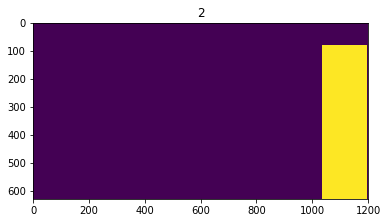

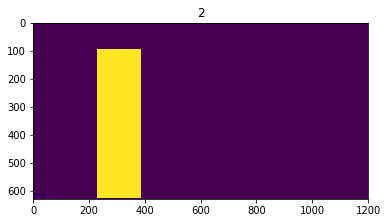

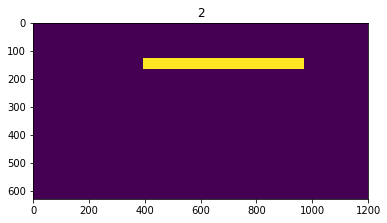

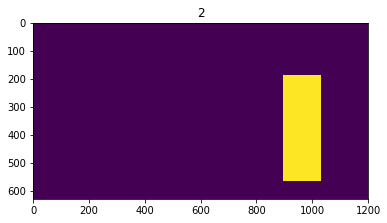

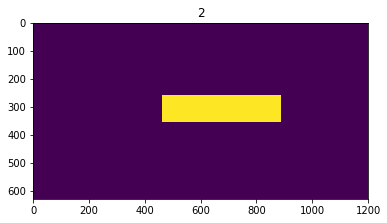

In [9]:
index = 1
plt.imshow(dataset_train.load_image(index))
plt.show()
masks, clss = dataset_train.load_mask(index)
for i in range(masks.shape[-1]):
    plt.imshow(masks[:, :, i])
    plt.title(clss[i])
    plt.show()

# azazazaz

In [10]:
class MyConfig(Config):
    NAME = "furniture"

    IMAGES_PER_GPU = 2
    
    IMAGE_MIN_DIM = 576
    IMAGE_MAX_DIM = 768

    # Uncomment to train on 8 GPUs (default is 1)
    GPU_COUNT = 2

    # Number of classes (including background)
    NUM_CLASSES = 1 + len(classes)

In [11]:
config = MyConfig()
config.display()


Configurations:
BACKBONE_SHAPES                [[192 192]
 [ 96  96]
 [ 48  48]
 [ 24  24]
 [ 12  12]]
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     4
BBOX_STD_DEV                   [ 0.1  0.1  0.2  0.2]
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.7
DETECTION_NMS_THRESHOLD        0.3
GPU_COUNT                      2
IMAGES_PER_GPU                 2
IMAGE_MAX_DIM                  768
IMAGE_MIN_DIM                  576
IMAGE_PADDING                  True
IMAGE_SHAPE                    [768 768   3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
MASK_POOL_SIZE                 14
MASK_SHAPE                     [28, 28]
MAX_GT_INSTANCES               100
MEAN_PIXEL                     [ 123.7  116.8  103.9]
MINI_MASK_SHAPE                (56, 56)
NAME                           furniture
NUM_CLASSES                    10
POOL_SIZE                      7
POST_NMS_ROIS_INFERENCE        1000
POST_NMS_ROIS_TRAIN

In [12]:
model = modellib.MaskRCNN(
    mode="training", 
    config=config,
    model_dir=MODEL_DIR
)

In [13]:
model.load_weights(
    './experiments/attempt3/furniture20180317T0042/mask_rcnn_furniture_0010.h5', 
    by_name=True
    # exclude=["mrcnn_class_logits", "mrcnn_bbox_fc", "mrcnn_bbox", "mrcnn_mask"]
)

In [15]:
print("Training network heads")
model.train(
    dataset_train, dataset_val,
    learning_rate=config.LEARNING_RATE,
    epochs=5,
    layers='heads',
    reset_epoch=True
)

Training network heads

Starting at epoch 0. LR=0.001

Checkpoint Path: /src/experiments/attempt3/furniture20180317T0042/mask_rcnn_furniture_{epoch:04d}.h5
Selecting layers to train
fpn_c5p5               (Conv2D)
fpn_c4p4               (Conv2D)
fpn_c3p3               (Conv2D)
fpn_c2p2               (Conv2D)
fpn_p5                 (Conv2D)
fpn_p2                 (Conv2D)
fpn_p3                 (Conv2D)
fpn_p4                 (Conv2D)
In model:  rpn_model
    rpn_conv_shared        (Conv2D)
    rpn_class_raw          (Conv2D)
    rpn_bbox_pred          (Conv2D)
mrcnn_mask_conv1       (TimeDistributed)
mrcnn_mask_bn1         (TimeDistributed)
mrcnn_mask_conv2       (TimeDistributed)
mrcnn_mask_bn2         (TimeDistributed)
mrcnn_class_conv1      (TimeDistributed)
mrcnn_class_bn1        (TimeDistributed)
mrcnn_mask_conv3       (TimeDistributed)
mrcnn_mask_bn3         (TimeDistributed)
mrcnn_class_conv2      (TimeDistributed)
mrcnn_class_bn2        (TimeDistributed)
mrcnn_mask_conv4       

/usr/local/lib/python3.5/dist-packages/tensorflow/python/ops/gradients_impl.py:95: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "


Epoch 1/5


/usr/local/lib/python3.5/dist-packages/scipy/ndimage/interpolation.py:600: UserWarning: From scipy 0.13.0, the output shape of zoom() is calculated with round() instead of int() - for these inputs the size of the returned array has changed.
  "the returned array has changed.", UserWarning)


1000/1000 [==============================] - 1201s - loss: 0.4144 - rpn_class_loss: 0.0108 - rpn_bbox_loss: 0.1379 - mrcnn_class_loss: 0.1049 - mrcnn_bbox_loss: 0.1608 - mrcnn_mask_loss: 0.0000e+00 - val_loss: 1.3988 - val_rpn_class_loss: 0.0208 - val_rpn_bbox_loss: 0.6018 - val_mrcnn_class_loss: 0.2455 - val_mrcnn_bbox_loss: 0.5307 - val_mrcnn_mask_loss: 0.0000e+00
Epoch 2/5
1000/1000 [==============================] - 1208s - loss: 0.3892 - rpn_class_loss: 0.0105 - rpn_bbox_loss: 0.1302 - mrcnn_class_loss: 0.0978 - mrcnn_bbox_loss: 0.1508 - mrcnn_mask_loss: 0.0000e+00 - val_loss: 1.3947 - val_rpn_class_loss: 0.0219 - val_rpn_bbox_loss: 0.6305 - val_mrcnn_class_loss: 0.1809 - val_mrcnn_bbox_loss: 0.5613 - val_mrcnn_mask_loss: 0.0000e+00
Epoch 3/5
1000/1000 [==============================] - 1204s - loss: 0.3656 - rpn_class_loss: 0.0104 - rpn_bbox_loss: 0.1224 - mrcnn_class_loss: 0.0923 - mrcnn_bbox_loss: 0.1406 - mrcnn_mask_loss: 0.0000e+00 - val_loss: 1.4748 - val_rpn_class_loss: 0.0

In [16]:
# Training - Stage 2
# Finetune layers from ResNet stage 4 and up
print("Fine tune Resnet stage 4 and up")
model.train(dataset_train, dataset_val,
            learning_rate=config.LEARNING_RATE,
            epochs=10,
            layers='4+')

Fine tune Resnet stage 4 and up

Starting at epoch 5. LR=0.001

Checkpoint Path: /src/experiments/attempt3/furniture20180317T0042/mask_rcnn_furniture_{epoch:04d}.h5
Selecting layers to train
res4a_branch2a         (Conv2D)
bn4a_branch2a          (BatchNorm)
res4a_branch2b         (Conv2D)
bn4a_branch2b          (BatchNorm)
res4a_branch2c         (Conv2D)
res4a_branch1          (Conv2D)
bn4a_branch2c          (BatchNorm)
bn4a_branch1           (BatchNorm)
res4b_branch2a         (Conv2D)
bn4b_branch2a          (BatchNorm)
res4b_branch2b         (Conv2D)
bn4b_branch2b          (BatchNorm)
res4b_branch2c         (Conv2D)
bn4b_branch2c          (BatchNorm)
res4c_branch2a         (Conv2D)
bn4c_branch2a          (BatchNorm)
res4c_branch2b         (Conv2D)
bn4c_branch2b          (BatchNorm)
res4c_branch2c         (Conv2D)
bn4c_branch2c          (BatchNorm)
res4d_branch2a         (Conv2D)
bn4d_branch2a          (BatchNorm)
res4d_branch2b         (Conv2D)
bn4d_branch2b          (BatchNorm)
res4d

/usr/local/lib/python3.5/dist-packages/tensorflow/python/ops/gradients_impl.py:95: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "


Epoch 6/10


/usr/local/lib/python3.5/dist-packages/scipy/ndimage/interpolation.py:600: UserWarning: From scipy 0.13.0, the output shape of zoom() is calculated with round() instead of int() - for these inputs the size of the returned array has changed.
  "the returned array has changed.", UserWarning)


1000/1000 [==============================] - 1460s - loss: 0.3332 - rpn_class_loss: 0.0094 - rpn_bbox_loss: 0.1145 - mrcnn_class_loss: 0.0805 - mrcnn_bbox_loss: 0.1288 - mrcnn_mask_loss: 0.0000e+00 - val_loss: 0.9839 - val_rpn_class_loss: 0.0106 - val_rpn_bbox_loss: 0.3211 - val_mrcnn_class_loss: 0.2977 - val_mrcnn_bbox_loss: 0.3545 - val_mrcnn_mask_loss: 0.0000e+00
Epoch 7/10
1000/1000 [==============================] - 2215s - loss: 0.2979 - rpn_class_loss: 0.0080 - rpn_bbox_loss: 0.1011 - mrcnn_class_loss: 0.0717 - mrcnn_bbox_loss: 0.1171 - mrcnn_mask_loss: 0.0000e+00 - val_loss: 0.9429 - val_rpn_class_loss: 0.0098 - val_rpn_bbox_loss: 0.3498 - val_mrcnn_class_loss: 0.2362 - val_mrcnn_bbox_loss: 0.3470 - val_mrcnn_mask_loss: 0.0000e+00
Epoch 8/10
1000/1000 [==============================] - 1997s - loss: 0.2577 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.0848 - mrcnn_class_loss: 0.0624 - mrcnn_bbox_loss: 0.1040 - mrcnn_mask_loss: 0.0000e+00 - val_loss: 0.9527 - val_rpn_class_loss: 0

In [ ]:
# Training - Stage 3
# Fine tune all layers
print("Fine tune all layers")
model.train(dataset_train, dataset_val,
            learning_rate=config.LEARNING_RATE / 10,
            epochs=100,
            layers='all')

Fine tune all layers

Starting at epoch 11. LR=0.0001

Checkpoint Path: /src/experiments/attempt3/furniture20180317T0042/mask_rcnn_furniture_{epoch:04d}.h5
Selecting layers to train
conv1                  (Conv2D)
bn_conv1               (BatchNorm)
res2a_branch2a         (Conv2D)
bn2a_branch2a          (BatchNorm)
res2a_branch2b         (Conv2D)
bn2a_branch2b          (BatchNorm)
res2a_branch2c         (Conv2D)
res2a_branch1          (Conv2D)
bn2a_branch2c          (BatchNorm)
bn2a_branch1           (BatchNorm)
res2b_branch2a         (Conv2D)
bn2b_branch2a          (BatchNorm)
res2b_branch2b         (Conv2D)
bn2b_branch2b          (BatchNorm)
res2b_branch2c         (Conv2D)
bn2b_branch2c          (BatchNorm)
res2c_branch2a         (Conv2D)
bn2c_branch2a          (BatchNorm)
res2c_branch2b         (Conv2D)
bn2c_branch2b          (BatchNorm)
res2c_branch2c         (Conv2D)
bn2c_branch2c          (BatchNorm)
res3a_branch2a         (Conv2D)
bn3a_branch2a          (BatchNorm)
res3a_branch2b

/usr/local/lib/python3.5/dist-packages/scipy/ndimage/interpolation.py:600: UserWarning: From scipy 0.13.0, the output shape of zoom() is calculated with round() instead of int() - for these inputs the size of the returned array has changed.
  "the returned array has changed.", UserWarning)
/usr/local/lib/python3.5/dist-packages/tensorflow/python/ops/gradients_impl.py:95: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
/usr/local/lib/python3.5/dist-packages/keras/engine/training.py:1987: UserWarning: Using a generator with `use_multiprocessing=True` and multiple workers may duplicate your data. Please consider using the`keras.utils.Sequence class.
  UserWarning('Using a generator with `use_multiprocessing=True`'


Epoch 12/100
1000/1000 [==============================] - 858s - loss: 0.1505 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.0431 - mrcnn_class_loss: 0.0411 - mrcnn_bbox_loss: 0.0620 - mrcnn_mask_loss: 0.0000e+00 - val_loss: 0.7912 - val_rpn_class_loss: 0.0371 - val_rpn_bbox_loss: 0.3979 - val_mrcnn_class_loss: 0.1174 - val_mrcnn_bbox_loss: 0.2389 - val_mrcnn_mask_loss: 0.0000e+00
Epoch 13/100
1000/1000 [==============================] - 806s - loss: 0.1422 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.0399 - mrcnn_class_loss: 0.0397 - mrcnn_bbox_loss: 0.0586 - mrcnn_mask_loss: 0.0000e+00 - val_loss: 0.8120 - val_rpn_class_loss: 0.0372 - val_rpn_bbox_loss: 0.4289 - val_mrcnn_class_loss: 0.1039 - val_mrcnn_bbox_loss: 0.2420 - val_mrcnn_mask_loss: 0.0000e+00
Epoch 14/100
1000/1000 [==============================] - 794s - loss: 0.1349 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0364 - mrcnn_class_loss: 0.0379 - mrcnn_bbox_loss: 0.0567 - mrcnn_mask_loss: 0.0000e+00 - val_loss: 0.8382 - val_rpn

# test

In [205]:
class InferenceConfig(MyConfig):
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1
    DETECTION_MIN_CONFIDENCE = 0.1
    DETECTION_NMS_THRESHOLD = 0.3

inference_config = InferenceConfig()

inference_config.display()


Configurations:
BACKBONE_SHAPES                [[192 192]
 [ 96  96]
 [ 48  48]
 [ 24  24]
 [ 12  12]]
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     1
BBOX_STD_DEV                   [ 0.1  0.1  0.2  0.2]
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.1
DETECTION_NMS_THRESHOLD        0.3
GPU_COUNT                      1
IMAGES_PER_GPU                 1
IMAGE_MAX_DIM                  768
IMAGE_MIN_DIM                  576
IMAGE_PADDING                  True
IMAGE_SHAPE                    [768 768   3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
MASK_POOL_SIZE                 14
MASK_SHAPE                     [28, 28]
MAX_GT_INSTANCES               100
MEAN_PIXEL                     [ 123.7  116.8  103.9]
MINI_MASK_SHAPE                (56, 56)
NAME                           furniture
NUM_CLASSES                    10
POOL_SIZE                      7
POST_NMS_ROIS_INFERENCE        1000
POST_NMS_ROIS_TRAIN

In [206]:
model = modellib.MaskRCNN(mode="inference", 
                          config=inference_config,
                          model_dir=MODEL_DIR)

model.load_weights(
    './experiments/attempt4/furniture20180317T0042/mask_rcnn_furniture_0003.h5',
    by_name=True
)

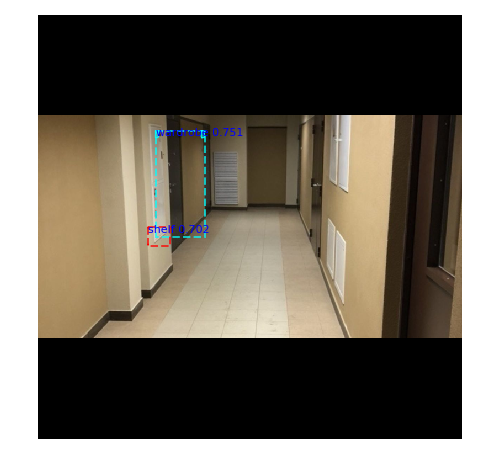

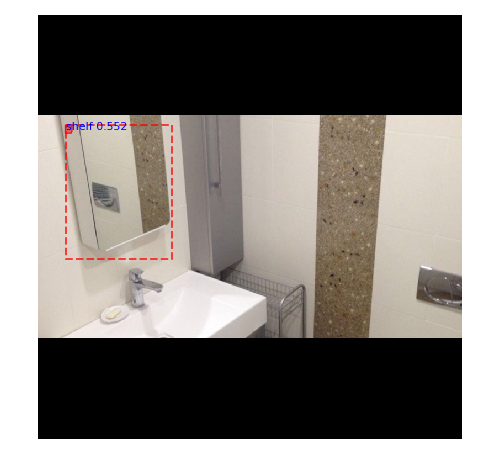

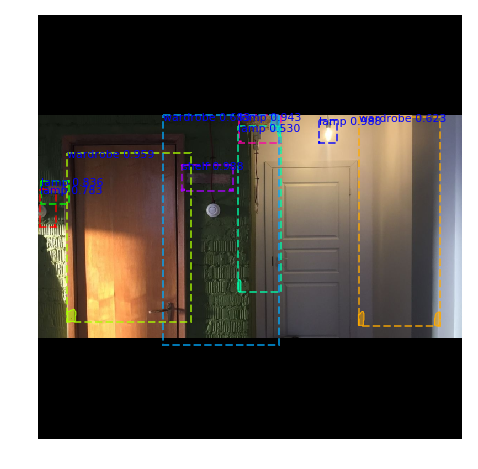

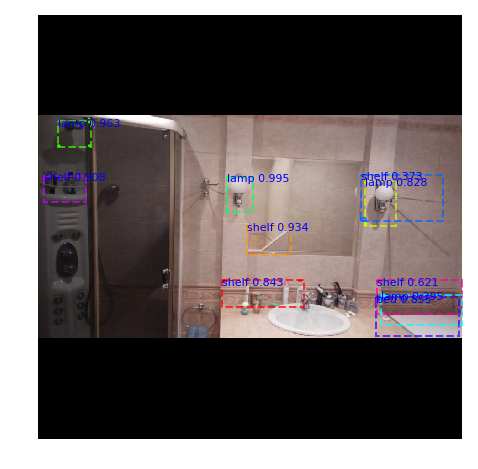

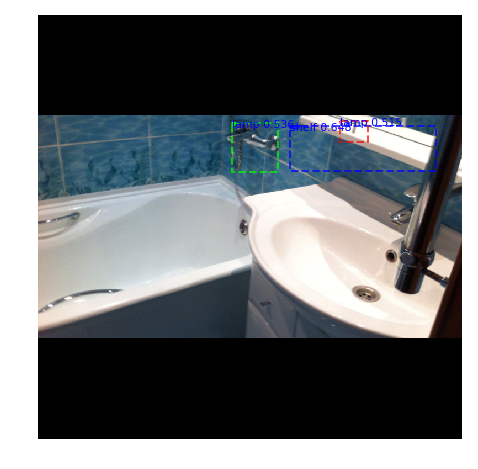

...

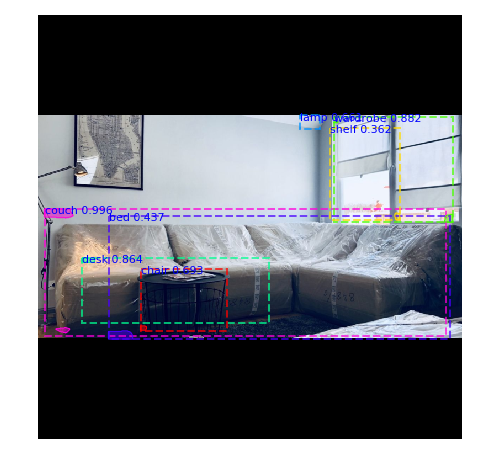

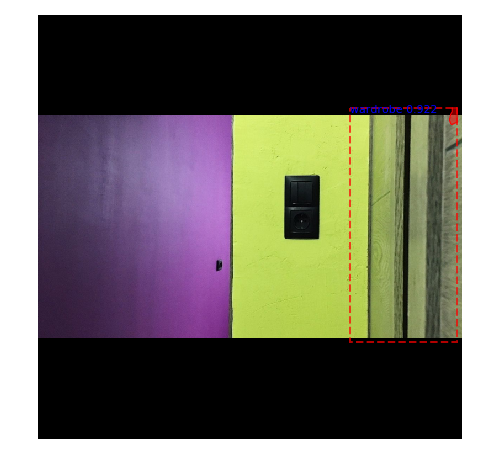

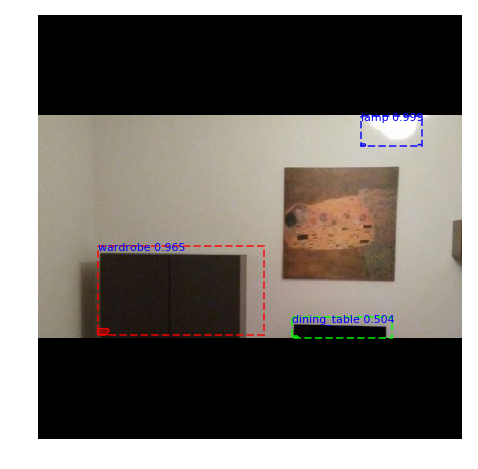

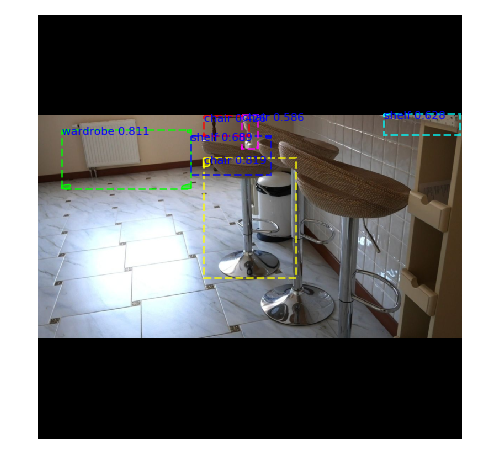

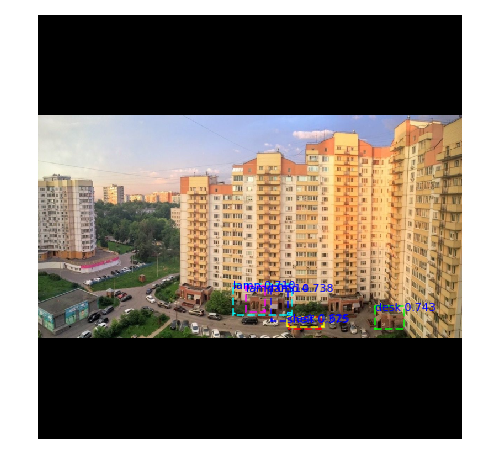

/usr/local/lib/python3.5/dist-packages/scipy/ndimage/interpolation.py:600: UserWarning: From scipy 0.13.0, the output shape of zoom() is calculated with round() instead of int() - for these inputs the size of the returned array has changed.
  "the returned array has changed.", UserWarning)


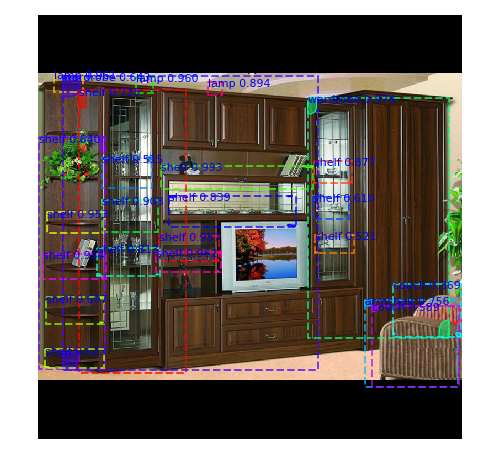

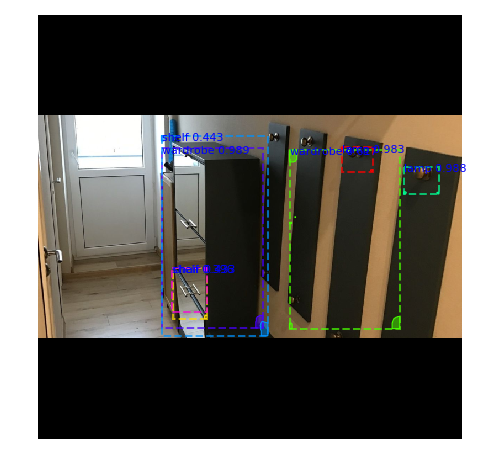

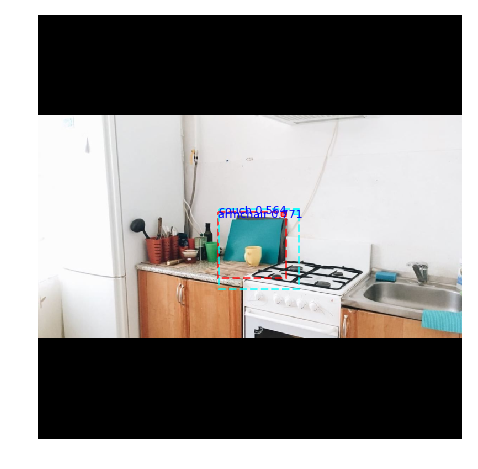

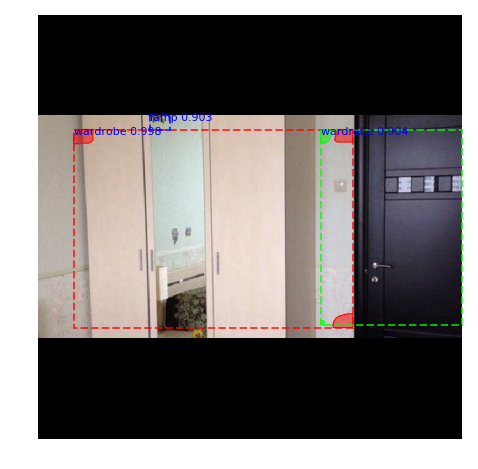

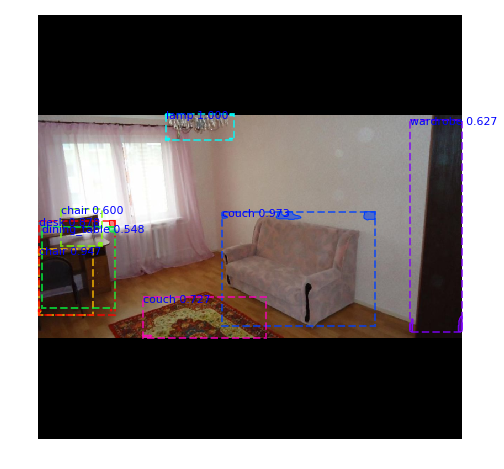

...

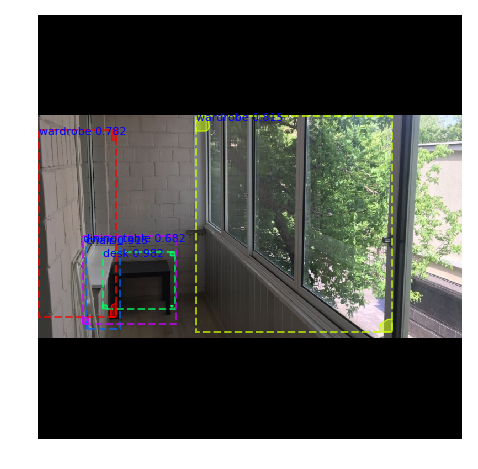

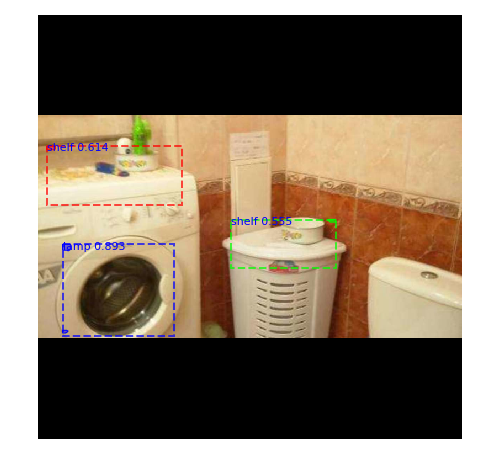

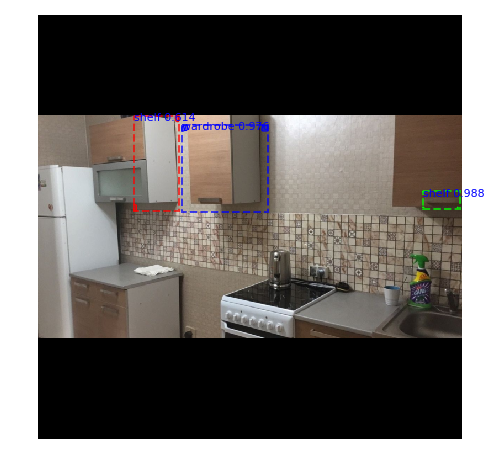

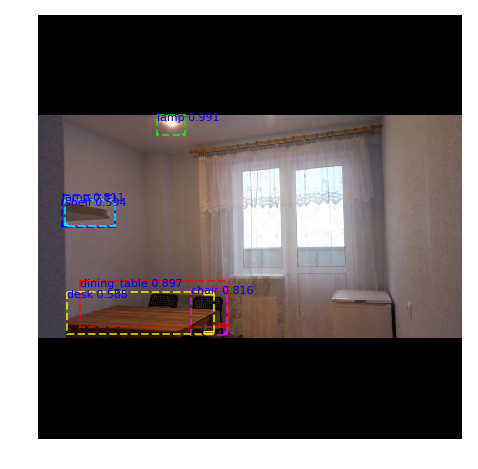

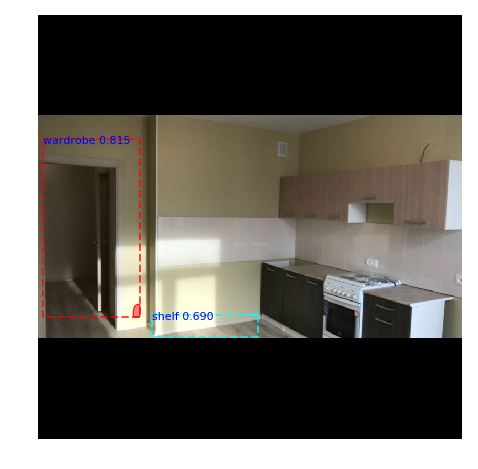

In [184]:
for i in range(1, 50):
    original_image, image_meta, gt_class_id, gt_bbox, gt_mask = modellib.load_image_gt(
        dataset_val, 
        inference_config, 
        i, 
        use_mini_mask=False
    )

    results = model.detect([original_image], verbose=0)

    r = results[0]
    visualize.display_instances(original_image, r['rois'], r['masks'], r['class_ids'], 
                                dataset_val.class_names, r['scores'], ax=get_ax())

In [207]:
def my_resize(image, config):
    image, window, scale, padding = utils.resize_image(
        image,
        min_dim=config.IMAGE_MIN_DIM,
        max_dim=config.IMAGE_MAX_DIM,
        padding=config.IMAGE_PADDING
    )
    return image, window, scale, padding

In [208]:
test_data = pd.read_csv('/data/sample_submission.csv')
print(len(test_data))
test_data.head()

3713


,id,input,prediction
0,0,"{""image"": ""https://dbrain-public.s3.eu-west-1....","{""aabb"": {""lamp"": [], ""armchair"": [], ""dining_..."
1,1,"{""image"": ""https://dbrain-public.s3.eu-west-1....","{""aabb"": {""lamp"": [], ""armchair"": [], ""dining_..."
2,2,"{""image"": ""https://dbrain-public.s3.eu-west-1....","{""aabb"": {""lamp"": [], ""armchair"": [], ""dining_..."
3,3,"{""image"": ""https://dbrain-public.s3.eu-west-1....","{""aabb"": {""lamp"": [], ""armchair"": [[[0.5962732..."
4,4,"{""image"": ""https://dbrain-public.s3.eu-west-1....","{""aabb"": {""lamp"": [], ""armchair"": [], ""dining_..."


In [209]:
test_data_dirpath = '/data/images_test'
for k, v in list(test_data.iterrows()):
    id = int(v['id'])
    img_filepath = join(test_data_dirpath, '%06d.jpg' % (int(id)))
    if k % 100 == 0:
        print(k)
    if not os.path.exists(img_filepath):
        print('No image {}'.format(id))
        continue
    else:
        img = cv2.imread(img_filepath)[:, :, ::-1]
        img_copy = img.copy()
        h, w = img.shape[:2]
        img, window, scale, padding = my_resize(img, inference_config)
        
        results = model.detect([img], verbose=0)

        r = results[0]
        
        n = len(r['scores'])
        result_json = {cls: [] for cls in classes}
        for i in range(n):
            class_id, roi, score = (
                r['class_ids'][i],
                r['rois'][i],
                r['scores'][i]
            )
            if score < inference_config.DETECTION_MIN_CONFIDENCE:
                continue
            cls = dataset_val.class_names[class_id]
            top_pad, left_pad = window[:2]
            def translate(x, y):
                x = ((x - left_pad) / scale) / w
                y = ((y - top_pad) / scale) / h
                return x, y
            top, left, bottom, right = roi
            left, top = translate(left, top)
            right, bottom = translate(right, bottom)
            
            rect = [
                [left, top],
                [left, bottom],
                [right, bottom],
                [right, top],
                [left, top]
            ]
            
            result_json[cls].append((rect, float(score)))
            
        result_json = {'aabb': result_json}
        test_data.set_value(k, 'prediction', json.dumps(result_json))

0
100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400
1500
1600
1700
1800
1900
2000
2100
2200
2300
2400
2500
2600
2700
2800
2900
3000
3100
3200
3300
3400
3500
3600
3700


In [ ]:
attempt4/furniture20180317T0042/mask_rcnn_furniture_0001

In [210]:
test_data.to_csv('/data/submisssions/mask_rcnn_furniture_0003_attempt4_raw.csv', index=None)

In [211]:
test_data

,id,input,prediction
0,0,"{""image"": ""https://dbrain-public.s3.eu-west-1....","{""aabb"": {""lamp"": [], ""shelf"": [], ""couch"": []..."
1,1,"{""image"": ""https://dbrain-public.s3.eu-west-1....","{""aabb"": {""lamp"": [], ""shelf"": [[[[0.5390625, ..."
2,2,"{""image"": ""https://dbrain-public.s3.eu-west-1....","{""aabb"": {""lamp"": [], ""shelf"": [[[[0.662760416..."
3,3,"{""image"": ""https://dbrain-public.s3.eu-west-1....","{""aabb"": {""lamp"": [[[[0.5963541666666666, 0.07..."
4,4,"{""image"": ""https://dbrain-public.s3.eu-west-1....","{""aabb"": {""lamp"": [], ""shelf"": [[[[0.671875, 0..."
5,5,"{""image"": ""https://dbrain-public.s3.eu-west-1....","{""aabb"": {""lamp"": [[[[0.044270833333333336, 0...."
6,6,"{""image"": ""https://dbrain-public.s3.eu-west-1....","{""aabb"": {""lamp"": [], ""shelf"": [[[[0.60546875,..."
7,7,"{""image"": ""https://dbrain-public.s3.eu-west-1....","{""aabb"": {""lamp"": [[[[0.8515625, 0.34201388888..."
8,8,"{""image"": ""https://dbrain-public.s3.eu-west-1....","{""aabb"": {""lamp"": [[[[0.66796875, 0.0324074074..."
9,9,"{""image"": ""https://dbrain-public.s3.eu-west-1....","{""aabb"": {""lamp"": [], ""shelf"": [], ""couch"": [[..."


# metrics

In [ ]:
import json
from shapely.geometry import Polygon, MultiPolygon

classes = ["armchair", "lamp", "chair", "wardrobe", "desk",
           "couch", "shelf", "bed", "dining_table"]
class_weights = {'armchair': 0.079456544379896146,
 'bed': 0.028866859166950479,
 'chair': 0.13942879882330855,
 'couch': 0.038575104688560381,
 'desk': 0.083724911259357243,
 'dining_table': 0.059900300391638142,
 'lamp': 0.33833361193911593,
 'shelf': 0.20583138380315716,
 'wardrobe': 0.025882485548015925}
top_level_key = "aabb"


def iou(target_bboxes, predicted_bboxes):
    target_polys = MultiPolygon([Polygon(i) for i in target_bboxes]).buffer(0)
    predicted_polys = MultiPolygon([Polygon(i) for i in predicted_bboxes]).buffer(0)
    intersection = target_polys.intersection(predicted_polys).area
    union = target_polys.union(predicted_polys).area

    try:
        return intersection / union
    except ZeroDivisionError as e:
        return 0


def multiclass_iou(target_result, predicted_result):
    target_result = json.loads(target_result)[top_level_key]
    predicted_result = json.loads(predicted_result)[top_level_key]
    class_ious = {cl: iou(target_result[cl], predicted_result[cl]) for cl in classes}
    weighted_iou = sum([cl_iou * class_weights[cl] for cl, cl_iou in class_ious.items()])
    return weighted_iou

In [201]:
class InferenceConfig(MyConfig):
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1
    DETECTION_MIN_CONFIDENCE = 0.1
    DETECTION_NMS_THRESHOLD = 0.3

inference_config = InferenceConfig()

inference_config.display()


Configurations:
BACKBONE_SHAPES                [[192 192]
 [ 96  96]
 [ 48  48]
 [ 24  24]
 [ 12  12]]
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     1
BBOX_STD_DEV                   [ 0.1  0.1  0.2  0.2]
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.1
DETECTION_NMS_THRESHOLD        0.3
GPU_COUNT                      1
IMAGES_PER_GPU                 1
IMAGE_MAX_DIM                  768
IMAGE_MIN_DIM                  576
IMAGE_PADDING                  True
IMAGE_SHAPE                    [768 768   3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
MASK_POOL_SIZE                 14
MASK_SHAPE                     [28, 28]
MAX_GT_INSTANCES               100
MEAN_PIXEL                     [ 123.7  116.8  103.9]
MINI_MASK_SHAPE                (56, 56)
NAME                           furniture
NUM_CLASSES                    10
POOL_SIZE                      7
POST_NMS_ROIS_INFERENCE        1000
POST_NMS_ROIS_TRAIN

In [202]:
model = modellib.MaskRCNN(mode="inference", 
                          config=inference_config,
                          model_dir=MODEL_DIR)

model.load_weights(
    './experiments/attempt4/furniture20180317T0042/mask_rcnn_furniture_0005.h5',
    by_name=True
)

In [203]:
test_ids = [int(os.path.splitext(os.path.basename(val_samples[i]['filepath']))[0])
           for i in range(len(val_samples))]

test_data = pd.read_csv('/data/train.csv')
metrics_scores = []
targets_dict = dict()
preds_dict = dict()
for test_id in test_ids:
    v = test_data.loc[test_id]
    id = int(v['id'])
    if id not in test_ids:
        continue
    img_filepath = join('/data/images', '%06d.jpg' % (int(id)))
    if not os.path.exists(img_filepath):
        print('No image {}'.format(id))
        continue
    else:
        img = cv2.imread(img_filepath)[:, :, ::-1]
        img_copy = img.copy()
        h, w = img.shape[:2]
        img, window, scale, padding = my_resize(img, inference_config)
        
        results = model.detect([img], verbose=0)

        r = results[0]
        
        n = len(r['scores'])
        result_json = {cls: [] for cls in classes}
        for i in range(n):
            class_id, roi, score = (
                r['class_ids'][i],
                r['rois'][i],
                r['scores'][i]
            )
            if score < inference_config.DETECTION_MIN_CONFIDENCE:
                continue
            cls = dataset_val.class_names[class_id]
            top_pad, left_pad = window[:2]
            def translate(x, y):
                x = ((x - left_pad) / scale) / w
                y = ((y - top_pad) / scale) / h
                return x, y
            top, left, bottom, right = roi
            left, top = translate(left, top)
            right, bottom = translate(right, bottom)
            
            rect = [
                [left, top],
                [left, bottom],
                [right, bottom],
                [right, top],
                [left, top]
            ]
            
            result_json[cls].append((rect, float(score)))
            
        result_json = {'aabb': result_json}
        predict = json.dumps(result_json)
        # target = json.loads(v['result'])
                                    
        targets_dict[test_id] = v['result']
        preds_dict[test_id] = predict
        
#         metrics_score = multiclass_iou(v['result'], predict)
#         metrics_scores.append(metrics_score)
        
        
        # test_data.set_value(k, 'prediction', json.dumps(result_json))

In [204]:
for thresh in np.arange(inference_config.DETECTION_MIN_CONFIDENCE, 1.0, 0.01):
    metrics_scores = []
    for test_id in targets_dict.keys():
        prob_pred = json.loads(preds_dict[test_id])
        target_a = targets_dict[test_id]

        cls_dict = {}
        for cls, polygons in prob_pred['aabb'].items():
            pred_polygons = []
            if polygons:
                for pol, prob in polygons:
                    if prob > thresh:
                        pred_polygons.append(pol)
            cls_dict[cls] = pred_polygons
        pred = json.dumps({"aabb": cls_dict})

        metrics_score = multiclass_iou(target_a, pred)
        metrics_scores.append(metrics_score)
    print(thresh, np.mean(metrics_scores))

0.1 0.0569034028887
0.11 0.0569034028887
0.12 0.0569034028887
0.13 0.0569034028887
0.14 0.0569034028887
0.15 0.0569034028887
0.16 0.0569034028887
0.17 0.0569034028887
0.18 0.0569034028887
0.19 0.0569034028887
0.2 0.0569034028887
0.21 0.0569034028887
0.22 0.0569034028887
0.23 0.0569034028887
0.24 0.0569034028887
0.25 0.0569034028887
0.26 0.0569034028887
0.27 0.0569034028887
0.28 0.0569034028887
0.29 0.0569034028887
0.3 0.0569172191636
0.31 0.0569172191636
0.32 0.0569172191636
0.33 0.0569235581176
0.34 0.0569235581176
0.35 0.0568303361077
0.36 0.0568303361077
0.37 0.0568303361077
0.38 0.0568303361077
0.39 0.0568303361077
0.4 0.0569289574847
0.41 0.0568170782319
0.42 0.0568170782319
0.43 0.0566355887417
0.44 0.056572361005
0.45 0.0563708477195
0.46 0.0562186874384
0.47 0.0561862299544
0.48 0.0561667916052
0.49 0.0562158254738
0.5 0.0562429839537
0.51 0.0561926105875
0.52 0.0562515892836
0.53 0.0562894676849
0.54 0.0564090825102
0.55 0.0565027628362
0.56 0.0567008288782
0.57 0.056766817319

KeyboardInterrupt: 

In [ ]:
mask_rcnn_furniture_0015.h5 0.3 0.0548779649829
attempt1/furniture20180317T0042/last.h5 говно
attempt2/furniture20180317T0042/mask_rcnn_furniture_0005.h5 0.3 0.0540255155264
attempt3/furniture20180317T0042/mask_rcnn_furniture_0010.h5 0.33 0.0552196712923 
attempt3/furniture20180317T0042/mask_rcnn_furniture_0012.h5 0.33 0.0553565741127 $$
attempt3/furniture20180317T0042/mask_rcnn_furniture_0000.h5 0.5 0.0564432810419  $$
attempt3/furniture20180317T0042/mask_rcnn_furniture_0004.h5 0.3 0.0548174821948
attempt3/furniture20180317T0042/mask_rcnn_furniture_0005.h5 0.59 0.0565719091788 | 0.35 0.0564128826338 $$
attempt3/furniture20180317T0042/mask_rcnn_furniture_0007.h5 0.34 0.0547277807084
attempt3/furniture20180317T0042/mask_rcnn_furniture_0002.h5 0.4 0.0543842989756
attempt3/furniture20180317T0042/mask_rcnn_furniture_0014.h5 0.3 0.0547633140958
attempt4/furniture20180317T0042/mask_rcnn_furniture_0000.h5 0.43 0.0561559031887
attempt4/furniture20180317T0042/mask_rcnn_furniture_0001.h5 0.41 0.0576388339552
attempt4/furniture20180317T0042/mask_rcnn_furniture_0002.h5
attempt4/furniture20180317T0042/mask_rcnn_furniture_0003.h5 0.54 0.05796
attempt4/furniture20180317T0042/mask_rcnn_furniture_0004.h5 0.37 0.056996
attempt4/furniture20180317T0042/mask_rcnn_furniture_0005.h5

In [69]:
def vis(img_tmp, pred):
    img = img_tmp.copy()
    h, w = img.shape[:2]
    pred = pred['aabb']
    for k, v in pred.items():
        for bbox in v:
            bbox = np.array(bbox)
            bbox[:, 0] *= w
            bbox[:, 1] *= h
            bbox = bbox.reshape((-1,1,2))
            cv2.polylines(img, [bbox.astype(np.int)], True, (255,255,255), 2)
    plt.imshow(img)
    plt.show()

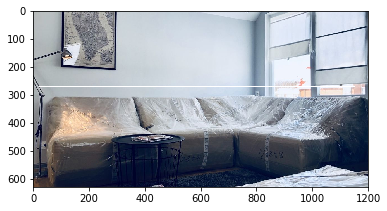

In [70]:
vis(img_copy, predict)

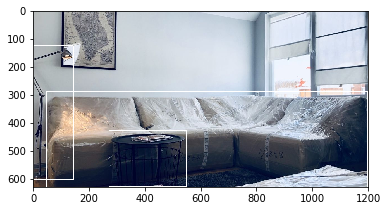

In [71]:
vis(img_copy, target)